Report by LATEEF MUIZZ KOLAPO 30028762@students.southwales.ac.uk

In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

The code above is to help format the notebook and make the outputs appear inline and within the document.

# 1.0 Data Preprocessing

This is to load all the modules to be used in this analysis.
The os module provides a way to interact with the Os of the machine, the glob module is used to retrieve the 
path names needed. Pandas,Numpy, Seaborn, Matplotlib.pyplot and Folium are modules used to interact with the
dataset and plot visualizations.

In [2]:
import os
import glob
from os import path
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins
sns.set()

We would be modify the code below gotten from here https://www.freecodecamp.org/news/how-to-combine-multiple-csv-files-with-8-lines-of-code-265183e0854/  to create a function that will merge all the 22 months into one single file for each region.

<u>To-do</u><br/>
In this phase we are trying to prepare the dataset into a format suitable for analysis.

<strong>Warning!!!!!</strong>
Since the document  is being copied from one machine to another the paths specified in this documnet would not be the same as that of the user of the document so ensure to copy the right paths!



Details
- The library used is Pandas, Os and glob which needs to be imported before use
- To use this chunk of code you will need to ensure you have two folders, one containing South Wales data and the other folder holds the North Wales data. Copy the paths to these folders and keep it somewhere as they are very crucial to this program.
- When using this program you will be required to specify file paths ensure you use the path you have copied
- If you want the program below to run ensure you have deleted any file with the same name as the output file you want to create as the code wont run if there is an existing file in the directory
- The Merged file for both North and South Wales data would be merged into the specified paths
- Use the python help method to see what the function does.

In [3]:
#define the function that takes two arguments the path of the file and the file name
def combine_all(fpath,fname):
    '''This is a function that merges all the files in a directory and compares the count of the rows of the
    combined file to the sum of the rows of all the component individual files. It is used to confirm the
    merged file is correct'''
    #use the os module to switch to the specified directory
    os.chdir(fpath)
    #check of the file exists in the dir and merge if it not using glob(get file names) and concat method
    if path.isfile(fname)==True:
        print('The Merged file already exists in directory please delete first or proceed with existing file')
    else:
        #pick the file extensions
        extension = 'csv'
        #assign all file names with the extension csv into a list and assign to variable
        all_filenames = [i for i in glob.glob('*.{}'.format(extension))]
        #combine all files in the list
        combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])
        #export to csv and name as file name inputed
        combined_csv.to_csv(fname, index=False, encoding='utf-8-sig')
        #read in the csvs with the specified file name
        df = pd.read_csv(fname)
        #confirm the count of the data
        tot_row_count = df['Reported by'].count()
        #get the individual counts of all the files and compare with total combine counts
        file_row = []
        for i in all_filenames:
            if i != fname:
                file_count = pd.read_csv(i)
                row = file_count['Reported by'].count()
                file_row.append(row)
                file_row_count = sum(file_row)
        return tot_row_count,file_row_count


<strong>Warning!!!!!</strong>
Ensure you insert the path to the folder that contains the North wales dataset only!

In [4]:
#Merge all the Northern Wales files, change this directory to the directory where the files are
combine_all("/home/kp/Documents/David Kidner Assessment/Assessment/Lateef M K 30028762/Northwales",'North_wales_tot.csv')

The Merged file already exists in directory please delete first or proceed with existing file


<strong>Warning!!!!!</strong>
Ensure you insert the path to the folder that contains the South wales dataset only!

In [5]:
#Merge all the Southern Wales files, change this directory to the directory where the files are
combine_all("/home/kp/Documents/David Kidner Assessment/Assessment/Lateef M K 30028762/Southwales",'South_wales_tot.csv')

The Merged file already exists in directory please delete first or proceed with existing file


### Outcome of Data Preprocessing

We now have a unified file for each of the different regions being studied North and South wales data for the 22 months being studied has been created. just viewing the outcome of the row cout above we will see that south wales has almost double the total crime 
count for north wales from January 2019 to october 2020. 

###  Data cleaning 1.0

<u>To-do</u><br/>
In this phase we have successfully merged our data and we will be proceeding with the data cleaning process.

<strong>Warning!!!!!</strong>
Ensure to specify the path where the files have been merged from the use of the combine_all function.


Details
- The library used is Pandas which needs to be imported before use
- To use this chunk of code you will need to ensure you specified the right paths when reading in the CSV with pandas read_csv method

In [6]:
#reading in the Combine North wales dataset  and the combined Southwales dataset
#function takes the location of the files and the file output name
n_wales = pd.read_csv('/home/kp/Documents/David Kidner Assessment/Assessment/Lateef M K 30028762/Northwales/North_wales_tot.csv')
s_wales = pd.read_csv('/home/kp/Documents/David Kidner Assessment/Assessment/Lateef M K 30028762/Southwales/South_wales_tot.csv') 

In [7]:
#print('The shape for North wales
#checking the shape of the data and missing values
print("Shape of the North wales data is {}".format(n_wales.shape))
print(f"Number of missing values: {n_wales.isnull().sum().sum()}")
print("Shape of the South wales data is {}".format(s_wales.shape))
print(f"Number of missing values: {s_wales.isnull().sum().sum()}")

Shape of the North wales data is (132506, 12)
Number of missing values: 190634
Shape of the South wales data is (268738, 12)
Number of missing values: 427140


In [8]:
#getting the number of missing files for North Wales
n_wales.isnull().sum()

Crime ID                  29048
Month                         0
Reported by                   0
Falls within                  0
Longitude                     8
Latitude                      8
Location                      0
LSOA code                     8
LSOA name                     8
Crime type                    0
Last outcome category     29048
Context                  132506
dtype: int64

In [9]:
#getting the number of missing files for South Wales
s_wales.isnull().sum()

Crime ID                  69219
Month                         0
Reported by                   0
Falls within                  0
Longitude                  4991
Latitude                   4991
Location                      0
LSOA code                  4991
LSOA name                  4991
Crime type                    0
Last outcome category     69219
Context                  268738
dtype: int64

In [10]:
#viewing the first 3 dataset from the North wales data
n_wales.head(3)

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context
0,99e11c4d3d67321dec0310f0adcd91fdd7b1f9ecd22226...,2019-05,North Wales Police,North Wales Police,-2.940366,53.203466,On or near Springwood Close,E01018313,Cheshire West and Chester 031A,Other theft,Investigation complete; no suspect identified,NaN
1,b4ad6ff1f4bb2148796ebd462235f334e8c5fe8582b0ff...,2019-05,North Wales Police,North Wales Police,-2.936462,53.199505,On or near Hafod Close,E01018317,Cheshire West and Chester 031E,Theft from the person,Unable to prosecute suspect,NaN
2,7b836e45537f2f0bd6f4848d0c414ac6e9f7a057694cd8...,2019-05,North Wales Police,North Wales Police,-2.934977,53.123656,On or near Burganey Court,E01018335,Cheshire West and Chester 046A,Violence and sexual offences,Court result unavailable,NaN


In [11]:
#viewing the first 3 dataset from the south wales data
s_wales.head(3)

,Crime ID,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type,Last outcome category,Context
0,b9d3e45f20bb3918c91f09030e40b5f1b4b31b733e8cf3...,2020-09,South Wales Police,South Wales Police,-3.247519,51.774366,On or near Ty Bryn,W01001481,Blaenau Gwent 006E,Violence and sexual offences,Under investigation,NaN
1,d9a109ab06645259fdeb46fddfb392aba3a2fb4d5cb589...,2020-09,South Wales Police,South Wales Police,-2.371702,53.548490,On or near Derby Road,E01004910,Bolton 034G,Violence and sexual offences,Unable to prosecute suspect,NaN
2,NaN,2020-09,South Wales Police,South Wales Police,-3.658828,51.634723,On or near Tudor Estate,W01000991,Bridgend 001A,Anti-social behaviour,NaN,NaN


### Observations from Data cleaning 1.0

1. Northern Wales has around 132506 rows of data with each row reperesenting a crime committed in the region
2. South Wales has around 268738 rows of data which is around twice the rows recorded for North wales, which looks like South wales has around twice as much of the northern wales crimes committed
3. The shape of the data is the same for both dataset and the columns and number ofcolumns match on both dataset.
4. From viewing the first 3 rows of the North wales and south wales dataset we can see that each row reperesents a crime committed with the crime ID being the unique identifier for each row. The row captures the location of the crime, month it occurred,outcome and the context in which the crime occurred
5. The month column is used to aggregate the crimes committed monthly and the month for which a crime occurred is whats captured.
6. Crime ID, Last outcome category and Context  are responsible for the missing values in both dataset with the null values in the South wales data higher than that of the North which is expected since South wales has more rows of data


###  Data cleaning 2.0

<u>To-do</u><br/>
We are trying to compare the crimes committed between the two police jurisdictions so we would not need columns like Last outcome category,Context and crime ID since it is established that each row is a distinct crime.

Details
- The library used is Pandas which needs to be imported before use
- We will be dropping redundant columns from the dataset

In [12]:
#We will be dropping columns that would not impact the analysis using the drop method
n_wales = n_wales.drop(['Context', 'Last outcome category','Crime ID'], axis=1)
n_wales.head()

,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type
0,2019-05,North Wales Police,North Wales Police,-2.940366,53.203466,On or near Springwood Close,E01018313,Cheshire West and Chester 031A,Other theft
1,2019-05,North Wales Police,North Wales Police,-2.936462,53.199505,On or near Hafod Close,E01018317,Cheshire West and Chester 031E,Theft from the person
2,2019-05,North Wales Police,North Wales Police,-2.934977,53.123656,On or near Burganey Court,E01018335,Cheshire West and Chester 046A,Violence and sexual offences
3,2019-05,North Wales Police,North Wales Police,-2.831948,52.998624,On or near Sarn Bank Road,E01018357,Cheshire West and Chester 047D,Violence and sexual offences
4,2019-05,North Wales Police,North Wales Police,-3.811959,53.321675,On or near Back East Parade,W01000132,Conwy 001A,Anti-social behaviour


In [13]:
#We will be dropping columns that would not impact the analysis using the drop method
s_wales = s_wales.drop(['Context', 'Last outcome category','Crime ID'], axis=1)
s_wales.head()

,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type
0,2020-09,South Wales Police,South Wales Police,-3.247519,51.774366,On or near Ty Bryn,W01001481,Blaenau Gwent 006E,Violence and sexual offences
1,2020-09,South Wales Police,South Wales Police,-2.371702,53.548490,On or near Derby Road,E01004910,Bolton 034G,Violence and sexual offences
2,2020-09,South Wales Police,South Wales Police,-3.658828,51.634723,On or near Tudor Estate,W01000991,Bridgend 001A,Anti-social behaviour
3,2020-09,South Wales Police,South Wales Police,-3.658828,51.634723,On or near Tudor Estate,W01000991,Bridgend 001A,Anti-social behaviour
4,2020-09,South Wales Police,South Wales Police,-3.658828,51.634723,On or near Tudor Estate,W01000991,Bridgend 001A,Anti-social behaviour


In [14]:
#re-checking the shape of the data and missing values
print("Shape of the North wales data is {}".format(n_wales.shape))
print(f"Number of missing values: {n_wales.isnull().sum().sum()}")
print("Shape of the South wales data is {}".format(s_wales.shape))
print(f"Number of missing values: {s_wales.isnull().sum().sum()}")

Shape of the North wales data is (132506, 9)
Number of missing values: 32
Shape of the South wales data is (268738, 9)
Number of missing values: 19964


In [15]:
#show missing values
n_wales.isnull().sum()

Month           0
Reported by     0
Falls within    0
Longitude       8
Latitude        8
Location        0
LSOA code       8
LSOA name       8
Crime type      0
dtype: int64

In [16]:
#show missing values
s_wales.isnull().sum()

Month              0
Reported by        0
Falls within       0
Longitude       4991
Latitude        4991
Location           0
LSOA code       4991
LSOA name       4991
Crime type         0
dtype: int64

In [17]:
#confirm we have same columns in dataset of both regions
n_wales_columns = set(list(n_wales.columns))
s_wales_columns = set(list(s_wales.columns))
#using the zip method to check if we have any column in either dataset not in the other
for i,j in zip(n_wales_columns,s_wales_columns):
    assert(i == j), \
       'There is a column in one of the regions not present in the other'

### Observations from Data cleaning 2.0

<u>To-do</u><br/>
We will be fixing missing and null values


Details

- We removed 3 columns that would not contribute to our analysis and which had a bulk of the missing values. After removing this values we checked for missing values again and although the missing values have reduced we can still notice we have missing values for Longitude,Latitude, LSOA code and LSOA name which are location details.

- We asserted that we have the same columns and number of columns in both datasets, this mean we could merge the dataset down the line. for now we use them individually so we can confirm they have similar distributions

###  Data cleaning 3.0 : Fixing all missing values

<
In this stage of our data cleaning procedure we will be fixing all null values for the location details missing. From the analysis above we can se that although all other location details have missing values the location variable(column) has no missing values so this would be used to fix the missing values in our dataset


Details
- The library used is Pandas which needs to be imported before use
- We will be dropping redundant columns from the dataset

In [18]:
#checking for Null values in the longitude column
s_wales[s_wales['Longitude'].isnull()]

,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type
12173,2020-09,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Anti-social behaviour
12174,2020-09,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Anti-social behaviour
12175,2020-09,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Anti-social behaviour
12176,2020-09,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Anti-social behaviour
12177,2020-09,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Anti-social behaviour
...,...,...,...,...,...,...,...,...,...
268733,2019-11,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Violence and sexual offences
268734,2019-11,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Violence and sexual offences
268735,2019-11,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Other crime
268736,2019-11,South Wales Police,South Wales Police,NaN,NaN,No Location,NaN,NaN,Other crime


In [19]:
#checking for Null values in the longitude column
n_wales[n_wales['Longitude'].isnull()]

,Month,Reported by,Falls within,Longitude,Latitude,Location,LSOA code,LSOA name,Crime type
6287,2019-05,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Violence and sexual offences
17765,2019-09,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Possession of weapons
23113,2020-04,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Anti-social behaviour
46956,2020-06,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Public order
78022,2020-01,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Other theft
78023,2020-01,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Other theft
97827,2019-07,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Criminal damage and arson
120879,2019-06,North Wales Police,North Wales Police,NaN,NaN,No Location,NaN,NaN,Public order


In [20]:
#checking count of rows with "No location"
n_wales[n_wales['Location'] == 'No Location'].count()

Month           8
Reported by     8
Falls within    8
Longitude       0
Latitude        0
Location        8
LSOA code       0
LSOA name       0
Crime type      8
dtype: int64

In [21]:
#checking count of rows with "No location"
s_wales[s_wales['Location'] == 'No Location'].count()

Month           4991
Reported by     4991
Falls within    4991
Longitude          0
Latitude           0
Location        4991
LSOA code          0
LSOA name          0
Crime type      4991
dtype: int64

From the above we can see that although Location shows that it has no missing values, the inputs for the columns shows that there is no location available, we would leave this dataset as it is and group the crimes with no location as unKnown location. All the missing values has been accounted for and we will proceed with the analysis.

In [22]:
n_wales['Month'].count()

132506

# 2.0 Data Wrangling and Normalisation

In this section of the Analysis we will shape our data into formats suitable for analysis. We will be creating individual tables for the two regions and also merging the dataframes into one for analytical purposes.

The data dataset to be used for this step has 10 columns. We can divide these columns into two. 
- Columns that shows crime details(Month, Reported by, Crime type)
- Columns that shows crime location details(Falls within, Longitude, Latitude, Location, LSOA code)

The Month contains the month the crime was committed, a row of the data is a crime committed in the month it was recorded. Most of the crime has a recorded location details for it but some do not. We wont be dealing with crime specific locations and as such this wont be part of the columns wrangled in this step. 

Reference for Month Number to Month name conversion in code below - https://stackoverflow.com/questions/37625334/python-pandas-convert-month-int-to-month-name/37625467

We will normalise the data using population since our data is a region based dataset, population might influence our outcome. <br/>
formular  = (Total crime count per region/region population) x 1000

That means that the numbers shown in the normalized data represent total number of crimes per 1000 people.

##### Step 1: Creating dataset for count of Crime type by month and season

In this step we will create the s_wales_grouped,n_wales_grouped and n_s_wales_grouped dataframes. Most of the wrangling would be done using built in methods and attributes of the Pandas module. The data created in this step is one that each row is a Crime type, normalized crime count ot 100,000 people and its corresponding month. This was done to have a way to compare the crime type for different time periods and compare the crime types. s_wales_grouped contains the South Wales data while n_wales_grouped contains Northern wales data. The n_s_wales_grouped concatenates both dataframes into one. 

<u>steps used</u>
- For each region the crime count was grouped by the Month and crime to give a dataset that shows crime rate of a particular crime type for a given month.
- The output of the grouping resulted two month column and as such we dropped one of them
- The column names where then renamed to sensible names that described the datapoints in the column
- We then had to reset the index to remove the month column has an index since we need it in our dataset
- We then used a string literal to tag each row for the region it reperesents
- The string split method was used to split the month column into Year and the month number which was then formatted to the corresponding month name
- A Seasons mapping dictionary was created to hold the different months and the corresponding season it falls into, this dictionary was then used to categorize the Months into the four seasons using a lambda function and the pandas apply method
- A dictionary covid_mapping was created to group the dataset into pre covid and post covid and was applied to the dataset with the same technique as above
- A crime dictionary was also created to encode each crime rate with 3 characters. This was then used to create a crime code column which is a code that reperesents each crime type
- The crime count was then normalized into total crimes per 100,000 people using the formular (Total crime count per region/region population) x 10,000
- Finally, the two datasets created for North and South wales was concatenated into one single dataset.

In [23]:
#Grouping data using the groupby method to group the data by month and crime type for a particuar region

#southwales data grouped and count of crime type derived
s_wales_temp = s_wales[['Month', 'Crime type']].groupby([s_wales['Month'], s_wales['Crime type']]).count()
#dropping the Month column
s_wales_temp = s_wales_temp.drop('Month',axis=1)
#renaming the crime type to column to crime count
s_wales_grouped = s_wales_temp.rename(columns={"Crime type": "Crime count"})
#resetting index to remove Crime type from being index
s_wales_grouped.reset_index(inplace=True)
#using string literal to assign Region name to dataframe
s_wales_grouped['Region'] = 'South Wales'
#splitting the month column into the year and the month number
s_wales_grouped[['Year','Month Name']] = s_wales_grouped.Month.str.split("-",expand=True,)
#converting the Month Number to Month name using referenced code above
s_wales_grouped['Month Name'] = pd.to_datetime(s_wales_grouped['Month Name'], format='%m').dt.month_name()\
.str.slice(stop=3)
#Creating a new column called season to group months into seasons
#create variable mapping for Months
seasons_mapping = {'Jan':'Winter','Dec':'Winter','Feb':'Winter','Mar':'Spring',\
                  'Apr':'Spring','May':'Spring','Jun':'Summer','Jul':'Summer','Aug':'Summer',\
                  'Sep':'Autumn','Oct':'Autumn','Nov':'Autumn'}
#use lambda function to apply function across the column top down
s_wales_grouped['season']= s_wales_grouped['Month Name'].apply(lambda x:seasons_mapping[x])
#create column to group months into pre covid and covid periods
#according to timeline in link https://bfpg.co.uk/2020/04/covid-19-timeline/ covid first patient in UK was Jan
# We will assume 2019 is pre covid and 2020 is covid
covid_mapping = {'2019':'Pre-Covid','2020':'Covid'}
#use lambda function to apply function across the column top down
s_wales_grouped['Covid']= s_wales_grouped['Year'].apply(lambda x:covid_mapping[x])

#creating a key for the crime types
crime_mapping = {'Other theft':'OT', 'Theft from the person':'TFP',
       'Violence and sexual offences':'VSO', 'Anti-social behaviour':'ASB',
       'Burglary':'BUG', 'Criminal damage and arson':'CDA', 'Drugs':'DRG', 'Public order':'PO',
       'Other crime':'OC', 'Possession of weapons':'POW', 'Robbery':'ROB', 'Vehicle crime':'VC',
       'Shoplifting':'SPL', 'Bicycle theft':'BT'}
#use lambda function to apply function across the column top down
s_wales_grouped['Crime code']= s_wales_grouped['Crime type'].apply(lambda x:crime_mapping[x])
#since our data is location based we will use the population of each region to normalise the data
s_wales_grouped['Norm Crime count']= s_wales_grouped['Crime count'].apply(lambda x:(x/299239) * 10000)




#Northwales data grouped and count of crime type derived
n_wales_temp = n_wales[['Month', 'Crime type']].groupby([n_wales['Month'], n_wales['Crime type']]).count()
n_wales_temp = n_wales_temp.drop('Month',axis=1)
n_wales_grouped = n_wales_temp.rename(columns={"Crime type": "Crime count"})
#resetting index to remove Crime type from being index
n_wales_grouped.reset_index(inplace=True)
#using string literal to assign Region name to dataframe
n_wales_grouped['Region'] = 'North Wales'
#splitting the month column into the year and the month number
n_wales_grouped[['Year','Month Name']] = n_wales_grouped.Month.str.split("-",expand=True,)
#converting the Month Number to Month name using referenced code above
n_wales_grouped['Month Name'] = pd.to_datetime(n_wales_grouped['Month Name'], format='%m').dt.month_name()\
.str.slice(stop=3)
#Creating a new column called season to group months into seasons
#create variable mapping for Months
#use lambda function to apply function across the column top down
n_wales_grouped['season']= n_wales_grouped['Month Name'].apply(lambda x:seasons_mapping[x])
#create column to group months into pre covid and covid periods
#according to timeline in link https://bfpg.co.uk/2020/04/covid-19-timeline/ covid first patient in UK was Jan
# We will assume 2019 is pre covid and 2020 is covid
#use lambda function to apply function across the column top down
n_wales_grouped['Covid']= n_wales_grouped['Year'].apply(lambda x:covid_mapping[x])

#use lambda function to apply function across the column top down
n_wales_grouped['Crime code']= n_wales_grouped['Crime type'].apply(lambda x:crime_mapping[x])
#since our data is location based we will use the population of each region to normalise the data
n_wales_grouped['Norm Crime count']= n_wales_grouped['Crime count'].apply(lambda x:(x/70073) * 10000)




#concatenating the two regions dataset
n_s_wales_grouped = pd.concat([n_wales_grouped,s_wales_grouped])
n_wales_grouped.head()

,Month,Crime type,Crime count,Region,Year,Month Name,season,Covid,Crime code,Norm Crime count
0,2019-01,Anti-social behaviour,1015,North Wales,2019,Jan,Winter,Pre-Covid,ASB,144.848943
1,2019-01,Bicycle theft,25,North Wales,2019,Jan,Winter,Pre-Covid,BT,3.567708
2,2019-01,Burglary,276,North Wales,2019,Jan,Winter,Pre-Covid,BUG,39.387496
3,2019-01,Criminal damage and arson,571,North Wales,2019,Jan,Winter,Pre-Covid,CDA,81.486450
4,2019-01,Drugs,106,North Wales,2019,Jan,Winter,Pre-Covid,DRG,15.127082


##### Step 2 Dataset for Monthly total crime count by region

This dataset was created to hold the total monthly crime rate of each region separately and also in a single dataframe. The crime rate was then normalized using the formular formular (Total crime count per region/region population) x 10,000. This is to basically hold monthly distribution of crime rate in North and South Wales. The pandas framework and its methods were used extensively in this step.

<u>steps used</u>
- The total crime count was grouped by the months and the columns were renamed using the rename method in pandas
- String literal was then used to assign the region to each row
- The data was normalised with the North and South wales population multiplied by a 10,000 to show crime per 10,000 people
- The index was reset to remove the month as the index
- The string split method was used to split the month column into Year and the month number which was then formatted to the corresponding month name
- Wrangled dataset for the two regions were then concatenated into a dataframe.


In [24]:
#getting the monthly total crime distribution of crime in north wales
#group crime count by month using group method
dist_n_wales = n_wales[['Crime type','Month']].groupby('Month').count()
#rename columns using rename method
dist_n_wales = dist_n_wales.rename({'Crime type': 'Monthly Crime count'}, axis=1)
#assign region to data
dist_n_wales['Region'] = 'North Wales'
#normalise data using population to crime per 10,000 people
dist_n_wales['Norm Monthly Crime']= dist_n_wales['Monthly Crime count'].apply(lambda x:(x/70073) * 10000)
#reset index
dist_n_wales.reset_index(inplace=True)
#split the Month column into year and month name
dist_n_wales[['Year','Month Name']] = dist_n_wales.Month.str.split("-",expand=True,)
#converting the Month Number to Month name using referenced code above
dist_n_wales['Month Name'] = pd.to_datetime(dist_n_wales['Month Name'], format='%m').dt.month_name()\
.str.slice(stop=3)




#getting the monthly total crime distribution of crime in south wales
#group crime count by month using group method
dist_s_wales = s_wales[['Crime type','Month']].groupby('Month').count()
#rename columns using rename method
dist_s_wales = dist_s_wales.rename({'Crime type': 'Monthly Crime count'}, axis=1)
#assign region to data
dist_s_wales['Region'] = 'South Wales'
#normalise data using population to crime per 10,000 people
dist_s_wales['Norm Monthly Crime']= dist_s_wales['Monthly Crime count'].apply(lambda x:(x/299239) * 10000)
#reset index
dist_s_wales.reset_index(inplace=True)
#split the Month column into year and month name
dist_s_wales[['Year','Month Name']] = dist_s_wales.Month.str.split("-",expand=True,)
#converting the Month Number to Month name using referenced code above
dist_s_wales['Month Name'] = pd.to_datetime(dist_s_wales['Month Name'], format='%m').dt.month_name()\
.str.slice(stop=3)


#concatenating both dataframes into one table using the Concat method in pandas
Monthly_crime_count_tot = pd.concat([dist_n_wales,dist_s_wales])
Monthly_crime_count_tot.head()

,Month,Monthly Crime count,Region,Norm Monthly Crime,Year,Month Name
0,2019-01,5672,North Wales,809.441582,2019,Jan
1,2019-02,5511,North Wales,786.465543,2019,Feb
2,2019-03,6071,North Wales,866.382201,2019,Mar
3,2019-04,6411,North Wales,914.903030,2019,Apr
4,2019-05,6288,North Wales,897.349907,2019,May


##### step 3 Dataset for  percentage of a crime type in a particular region

This dataset was created to hold the total crime rate per crime type for both South and Northern wales, we then create a unified dataframe to hold both datasets.

<u>steps used</u>
- We used the value_counts method of pandas to get the unique crime types present in our dataset then we use the dict method to convert this into a dictionary
- The pandas DataFrame method was chained with the from_dict method used to create a dataframe from a dictionary
- The columns method was used to name our new dataset
- We then derived the monthly crime percentage but this was later dropped as it was not used
- We  normalised our data with the North and South wales population multiplied by a 10,000 to show crime per 10,000 people
- Finally, the two datasets created where concatenated into one.


In [25]:
#crime type by region
#Creating the total rate of crime in North Wales grouped by the  crime types 
#get the count of each crime type and then use dict method to convert it into a dictionary
crime_cnt_n_wales = dict(n_wales['Crime type'].value_counts())
#Use pandas to convert the dictionary into a dataframe
crime_cnt_n_wales = pd.DataFrame.from_dict(crime_cnt_n_wales,orient='index').reset_index()
#rename the new columns using the pandas column method
crime_cnt_n_wales.columns = ['Crime type','Tot_cnt']
#use string literal to assign region
crime_cnt_n_wales['Region']='North Wales'
#calculate crime percentage of each crime type
crime_cnt_n_wales['Percent'] = (crime_cnt_n_wales['Tot_cnt'] / crime_cnt_n_wales['Tot_cnt'].sum()) * 100
#normalise data using population
crime_cnt_n_wales['norm']= crime_cnt_n_wales['Tot_cnt'].apply(lambda x:(x/70073) * 10000)




#Creating the total rate of crime in South Wales grouped by the  crime types 
#get the count of each crime type and then use dict method to convert it into a dictionary
crime_cnt_s_wales = dict(s_wales['Crime type'].value_counts())
#Use pandas to convert the dictionary into a dataframe
crime_cnt_s_wales = pd.DataFrame.from_dict(crime_cnt_s_wales,orient='index').reset_index()
#rename the new columns using the pandas column method
crime_cnt_s_wales.columns = ['Crime type','Tot_cnt']
#use string literal to assign region
crime_cnt_s_wales['Region']='South Wales'
#calculate crime percentage of each crime type
crime_cnt_s_wales['Percent'] = (crime_cnt_s_wales['Tot_cnt'] / crime_cnt_s_wales['Tot_cnt'].sum()) * 100
#normalise data using populatio
crime_cnt_s_wales['norm']= crime_cnt_s_wales['Tot_cnt'].apply(lambda x:(x/299239) * 10000)




#concatenating the total rate of crime in South and North Wales grouped by the  crime types
crime_cnt_tot = pd.concat([crime_cnt_n_wales,crime_cnt_s_wales])
#drop the percentage column
crime_cnt_tot =crime_cnt_tot.drop(['Percent'], axis=1)
crime_cnt_tot.head()

,Crime type,Tot_cnt,Region,norm
0,Violence and sexual offences,49913,North Wales,7123.000300
1,Anti-social behaviour,29048,North Wales,4145.391235
2,Criminal damage and arson,12842,North Wales,1832.660226
3,Public order,11008,North Wales,1570.933170
4,Other theft,7856,North Wales,1121.116550


### Outputs From Wrangling 

- We need the data to be grouped by two variables, which is the Month of the observations and the crime type then the count of the crime type would be taken. the output of the wrangling in Step 1 above produced a dataframe which satisfies this requirement 
<br/>
<br/>
- A dataframe was needed to hold the distribution of the monthly measurement by the two regions. We have three outputs from this step which is the monthly data from south wales, North wales and a unified table holding all the monthly crimes grouped by the region
<br/>
<br/>
- A dataframe was needed to hold the distribution of the monthly measurement by the two regions. We have three outputd from this step which is the monthly data from south wales, North wales and a unified table holding all the monthly crimes grouped by the region
<br/>
<br/>
- The dataset was normalized using population of each region. The output gave the crime rate per 100,000 people in both regions


<u><h5>Output dataframes(tables)</h5>
<br/>
<br/>
<strong>n_s_wales_grouped</strong>: This is a combined dataframe of the North and South wales dataset categorized into the crime count grouped by the crime type
<br/>
<br/>
<strong>s_wales_grouped</strong>: This is a dataframe of the South wales dataset categorized into the crime count grouped by the crime type
<br/>
<br/>
<strong>n_wales_grouped</strong>: This is a dataframe of the North wales dataset categorized into the crime count grouped by the crime type
<br/>
<br/>
<strong>dist_s_wales</strong>: This shows the monthly crime count in the South Wales police district
<br/>
<br/>
<strong>dist_n_wales</strong>: This shows the monthly crime count in the North Wales police district
<br/>
<br/>
<strong>Monthly_crime_count_tot</strong>: This shows the combined monthly crime count in the North and South Wales police district
<br/>
<br/>
<strong>crime_cnt_n_wales</strong>: This is the total Crime count grouped into the crime type for the North wales region
<br/>
<br/>
<strong>crime_cnt_s_wales</strong>: This is the total Crime count grouped into the crime type for the North wales region
<br/>
<br/>
<strong>crime_cnt_tot</strong>:This is the total Crime count grouped into the crime type combined for the North and South wales region</u>


# 3.0 Data Exploration

In this section we will start exploring our dataset Graphically and also produce some summary statistics to understand the dataset. We will show plots to visualise our data.s

<u>To-do</u><br/>
Exploring the dataset using the different dataframes created during the wrangling phase

Details
- The library used is Pandas, Numpy, Seaborn and Matplotlib.pyplot which needs to be imported before use
- To use this chunk of code you will need to use the dataframes listed in the wrangling phase above
- Each section shows the analysis question being answered and each section as an output summarizing the results
- Ensure the Data Exploration application is not working to avoid interference
- Ensure The method of any section is called.
- the section starts with a summary statistics which just shows a summary of the data


<h4>summary statistics</h4>

In [26]:
#this datasets shows the monthly total crime rate for North and South wales
print(dist_s_wales.describe())

       Monthly Crime count  Norm Monthly Crime
count            22.000000           22.000000
mean          12215.363636          408.214291
std            1235.897112           41.301338
min           10322.000000          344.941669
25%           11271.250000          376.663804
50%           12066.500000          403.239551
75%           13000.250000          434.443706
max           15541.000000          519.350753


<h4>South Wales</h4>
The average monthly crime rate in South wales shows that we have a average of approximately 12,000 crimes committed monthly which seems high, but when we factor population into the analysis we can see it reduces to about 408 crimes per 10,000 people.

- The standard deviation shows that on a average the monthly crime rate measured tend to be around (+ or -) 12,000 crimes from the average monthly crimes but when we factor population that comes into around (+ or -) 41

- The month with the least crime rate had about 10,322 whih is 344 crimes per 10,000
- The month with the maximum crime rate had 15,541 at 519 crimes per 10,000 people monthly

In [27]:
print(dist_n_wales.describe())

       Monthly Crime count  Norm Monthly Crime
count            22.000000           22.000000
mean           6023.000000          859.532202
std             468.567828           66.868527
min            5348.000000          763.204087
25%            5675.750000          809.976739
50%            5991.500000          855.036890
75%            6380.250000          910.514749
max            6964.000000          993.820730


<h4>North Wales</h4>
The average monthly crime rate in North wales shows that we have a average of approximately 6,000 crimes committed monthly which is about half of that noticed for South Wales, but when we factor population into the analysis we can see it increases to about 859 crimes per 10,000 people which doubles that of South Wales.

- The standard deviation shows that on a average the monthly crime rate measured tend to be around + or - 468 crimes from the average monthly crimes but when we factor population that comes into around + or - 66
- The month with the least crime rate had about 10,322 whih is 344 crimes per 10,000
- The month with the maximum crime rate had 5348 at 855 crimes per 10,000 people monthly

<h4>Key Points</h4>

- Although overall crime rate in South Wales is double the figures noticed for North Wales. North Wales has more crime rate per 10,000 people than South Wales

- South Wales has a lesser crime rate standard deviation than North Wales showing that values noticed for South Wales are closer to the mean than that of the North Wales to its mean

In [28]:
#South Wales Crime count per crime type
crime_cnt_s_wales.value_counts()

Crime type                    Tot_cnt  Region       Percent    norm       
Violence and sexual offences  77116    South Wales  28.695607  2577.070502    1
Vehicle crime                 13155    South Wales  4.895102   439.615157     1
Theft from the person         1886     South Wales  0.701799   63.026544      1
Shoplifting                   15989    South Wales  5.949661   534.322064     1
Robbery                       945      South Wales  0.351644   31.580108      1
Public order                  24342    South Wales  9.057893   813.463486     1
Possession of weapons         1350     South Wales  0.502348   45.114440      1
Other theft                   15967    South Wales  5.941475   533.586865     1
Other crime                   4057     South Wales  1.509649   135.577248     1
Drugs                         8815     South Wales  3.280146   294.580586     1
Criminal damage and arson     22278    South Wales  8.289859   744.488519     1
Burglary                      10363    South 

In [29]:
#North Wales Crime count per crime type
crime_cnt_n_wales.value_counts()

Crime type                    Tot_cnt  Region       Percent    norm       
Violence and sexual offences  49913    North Wales  37.668483  7123.000300    1
Vehicle crime                 2960     North Wales  2.233861   422.416623     1
Theft from the person         335      North Wales  0.252819   47.807287      1
Shoplifting                   6698     North Wales  5.054865   955.860317     1
Robbery                       372      North Wales  0.280742   53.087494      1
Public order                  11008    North Wales  8.307548   1570.933170    1
Possession of weapons         603      North Wales  0.455074   86.053116      1
Other theft                   7856     North Wales  5.928788   1121.116550    1
Other crime                   2171     North Wales  1.638416   309.819759     1
Drugs                         2683     North Wales  2.024814   382.886418     1
Criminal damage and arson     12842    North Wales  9.691637   1832.660226    1
Burglary                      5280     North 

<h4>Key Points</h4>

- The top 5 crimes in North and South Wales are from similar crime types

<h3>Which Regions Need more Police patrols?</h3>
To answer this question we will be finding the top 10 crime locations in both South wales and North Wales. We would not be using normalized data since we are not comparing this two region in this analysis. We will use the n_wales and s_wales dataframe with the Seaborn package for our plots here which makes them look nicer and more intuitive. 

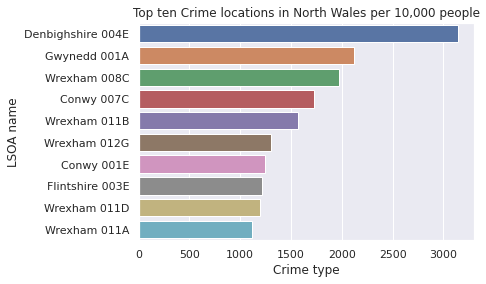

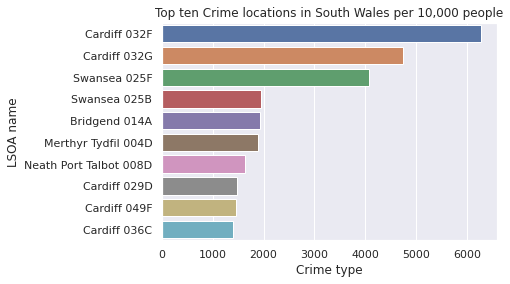

Help on function police_patrol in module __main__:

police_patrol()
    This functions shows the top 10 locations within the different regions that has the highest crime rate
    this is to recommend locations in need of frequent police patrol to curb crime in the area.



In [30]:
def police_patrol():
    '''This functions shows the top 10 locations within the different regions that has the highest crime rate
    this is to recommend locations in need of frequent police patrol to curb crime in the area.'''
    # define a temporary variable to hold the count of crimes grouped by crime location
    n_policing_temp = n_wales[['LSOA name','Crime type']].groupby('LSOA name').count()
    #reset index of the variable to change the current index
    n_policing_temp.reset_index(inplace=True)
    #sort the values in descending order to show top values
    n_policing = n_policing_temp.sort_values(by=['Crime type'],ascending=False).head(10)
    #use seaborn barplot method to create a bar plot of the top 10 values and set a title
    _ = sns.barplot(x = 'Crime type', y = 'LSOA name',  data= n_policing)\
    .set_title("Top ten Crime locations in North Wales per 10,000 people")
    plt.show()
    # define a temporary variable to hold the count of crimes grouped by crime location
    s_policing_temp = s_wales[['LSOA name','Crime type']].groupby('LSOA name').count()
    #reset index of the variable to change the current index
    s_policing_temp.reset_index(inplace=True)
    #sort the values in descending order to show top values
    s_policing = s_policing_temp.sort_values(by=['Crime type'],ascending=False).head(10)
    #use seaborn barplot method to create a bar plot of the top 10 values and set a title
    _ = sns.barplot(x = 'Crime type', y = 'LSOA name',  data= s_policing)\
    .set_title("Top ten Crime locations in South Wales per 10,000 people")
    plt.show()
    #call help method on this function to show what it does to the user
    help(police_patrol)
police_patrol()

<h4>Output</h4>
To help the state manage the resources and provide an upstream approach to crime fighting, we will be recommending more police patrol teams to be deployed to the top 10 crime locations in North and South Wales as we believe the present of police personel in this locations would help reduce crime rate. The plots above shows the recommended locations for both North and South Wales.

<h3>Which Crime type has the highest crime rate across Northern and Southern Wales?</h3>

To answer this question we would be using the n_s_wales_grouped dataframe. We want to know the most common crime types in South and North Wales and see if we have any similarities in the crime types. We will be using the FacetGrid plot method in Seaborn which helps plot barcharts for all the months in a grid. The row shows the Month while the Columns shows the region that is currently being analysed.

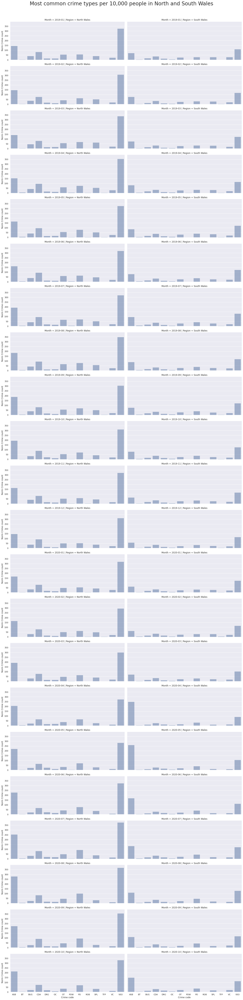

Help on function Common_crimes in module __main__:

Common_crimes()
    This function creates a grid plot using seaborn to show the a monthly barplot of the crime rate of
    the different crime type. The rows shows the month while the column shows the region.

{'Other theft': 'OT', 'Theft from the person': 'TFP', 'Violence and sexual offences': 'VSO', 'Anti-social behaviour': 'ASB', 'Burglary': 'BUG', 'Criminal damage and arson': 'CDA', 'Drugs': 'DRG', 'Public order': 'PO', 'Other crime': 'OC', 'Possession of weapons': 'POW', 'Robbery': 'ROB', 'Vehicle crime': 'VC', 'Shoplifting': 'SPL', 'Bicycle theft': 'BT'}


In [31]:
def Common_crimes():
    '''This function creates a grid plot using seaborn to show the a monthly barplot of the crime rate of
    the different crime type. The rows shows the month while the column shows the region.'''
    #We will plot a grid plot with a barchart showing the Crime count by crime type monthly for each region 
    #North Wales to the Left and South Wales to the right
    #creating a FacetGrid with Seaborn library and this is where we select dataset to be used
    grid = sns.FacetGrid(n_s_wales_grouped, row='Month', col='Region', height=3.5,aspect = 2.65)
    #create a variable crime order to hold the order in which the plots would be displayed
    crime_order = list(n_s_wales_grouped['Crime code'].unique())
    #lets populate the facetGrid with the specific plots and add the order
    _ = grid.map(sns.barplot, 'Crime code','Norm Crime count',alpha=0.5,order = crime_order )
    grid.fig.subplots_adjust(top=0.96)
    #adding the title of the plot
    _ = grid.fig.suptitle('Most common crime types per 10,000 people in North and South Wales', fontsize=28)
    plt.show()
    #call help method on this function to show what it does to the user
    help(Common_crimes)
    #show the crime codes
    print(crime_mapping)
Common_crimes()

<h4>Output</h4>

- From the grid plot above we can see that across all the months and in both regions Violence and sexual offences(VSO) and Anti-social behaviour(ASB) have the highest crime rate for both South and North Wales. We have similar trends in crime type for both North and South Wales. 
- North Wales has around twice the rate of Violent and Sexual offences as South wales per 10,000 people although South Wales has a higher rate of these crimes in total.

<h3>What crimes increased, decreased or remained the same during the Pandemic Lockdown?</h3>

We would be using the n_s_wales_grouped dataframe to find the effects of the covid lockdown on crimes to see if any crime type took a deep during the lockdown. We will be using the normalized crime count in this case, so we are looking at the crime count per 10,000 people in North and South Wales. The seaborn FacetGrid method will also be used here. The rows of the plot shows pre-covid and during covid while the column shows the region.

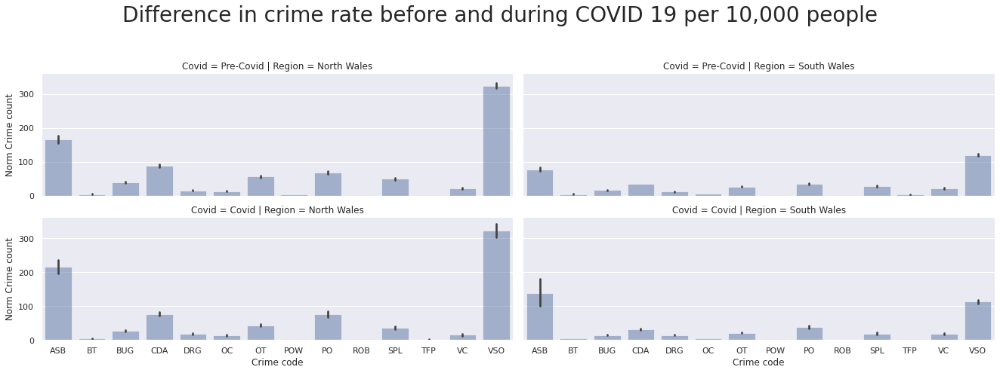

Help on function Covid_crimes in module __main__:

Covid_crimes()
    This function displays a barplot showing a comparison between the crime rate before covid and during
    covid, This was created using the seaborn gridplot module

{'Other theft': 'OT', 'Theft from the person': 'TFP', 'Violence and sexual offences': 'VSO', 'Anti-social behaviour': 'ASB', 'Burglary': 'BUG', 'Criminal damage and arson': 'CDA', 'Drugs': 'DRG', 'Public order': 'PO', 'Other crime': 'OC', 'Possession of weapons': 'POW', 'Robbery': 'ROB', 'Vehicle crime': 'VC', 'Shoplifting': 'SPL', 'Bicycle theft': 'BT'}


In [32]:
def Covid_crimes():
    '''This function displays a barplot showing a comparison between the crime rate before covid and during
    covid, This was created using the seaborn gridplot module'''
    #We will plot a grid plot with a barchart showing the Crime count by crime type monthly for each region 
    #North Wales to the Left and South Wales to the right
    #creating a FacetGrid with Seaborn library and assigning data to be used
    grid = sns.FacetGrid(n_s_wales_grouped, row='Covid', col='Region', height=3.5,aspect = 2.65)
    #create a variable crime order to hold the order in which the plots would be displayed
    crime_order2 = list(n_s_wales_grouped['Crime code'].unique())
    #lets populate the facetGrid with the specific plots and add the order
    _ = grid.map(sns.barplot, 'Crime code','Norm Crime count',alpha=0.5,order = crime_order2)
    grid.fig.subplots_adjust(top=0.8)
    #adding the title of the plot
    _ = grid.fig.suptitle('Difference in crime rate before and during COVID 19 per 10,000 people', fontsize=28)
    plt.show()
    #call help method on this function to show what it does to the user
    help(Covid_crimes)
    #show the crime codes
    print(crime_mapping) 
Covid_crimes()

<strong>Reduced during Covid </strong>

- From the plot above we can see that Burglary reduced almost by half of what it was before covid.
- Criminal damage and arson also reduced by a bit during Covid compared to the period before.
- Robbery reduced to almost non existence during covid
- Shoplifting and Vehicle crimes reduced a bit during covid

<strong>Increased during covid </strong>

- We saw an increase in Anti social behaviour during Covid which may be due to the new social regulations around covid lockdown.

<strong>Remained the same </strong>

Drug use, Other crime, Other theft, Possession of Weapons, Theft from the person, Violence and sexual offences and Bicycle theft all remained almost unchanged during Covid.

<h3>Effects of Season on burglary, is it more prevalent in Summer or Winter?</h3>

The analysis is to check for differences in Burglary rate during the summer and winter. We would be using the n_s_wales_grouped dataframe for this and also a FacetGrid. The row shows the season while the column shows the region.

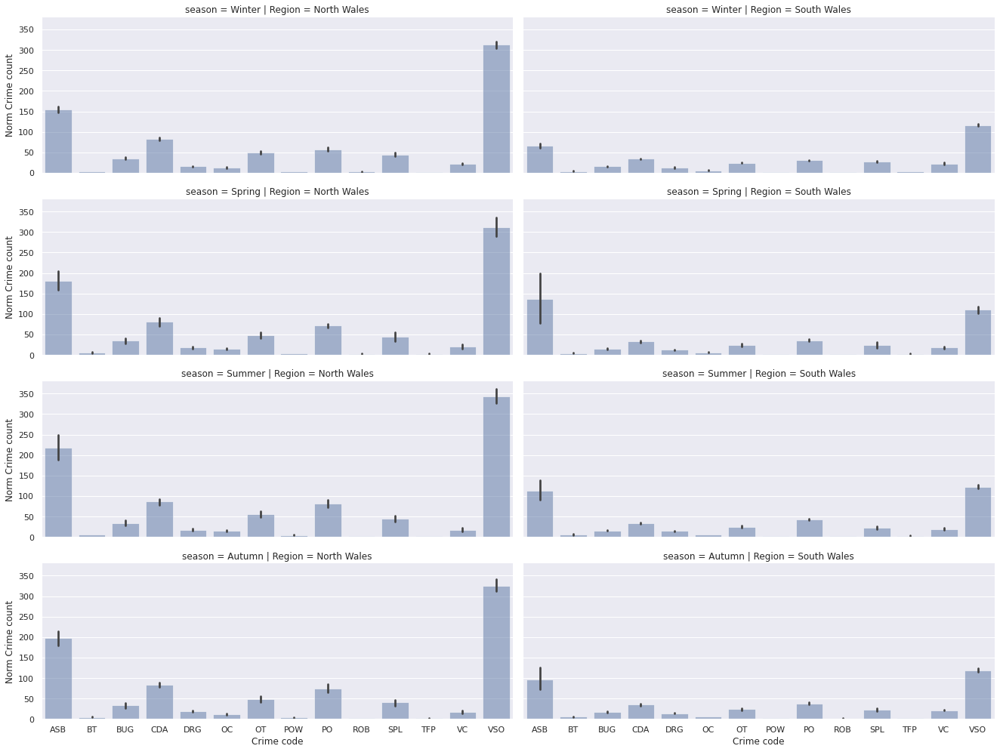

Help on function Seasonal_crimes in module __main__:

Seasonal_crimes()
    This function displays a barplot showing a comparison between the crime rate grouped by season, 
    This was created using the seaborn gridplot module

{'Other theft': 'OT', 'Theft from the person': 'TFP', 'Violence and sexual offences': 'VSO', 'Anti-social behaviour': 'ASB', 'Burglary': 'BUG', 'Criminal damage and arson': 'CDA', 'Drugs': 'DRG', 'Public order': 'PO', 'Other crime': 'OC', 'Possession of weapons': 'POW', 'Robbery': 'ROB', 'Vehicle crime': 'VC', 'Shoplifting': 'SPL', 'Bicycle theft': 'BT'}


In [33]:
def Seasonal_crimes():
    '''This function displays a barplot showing a comparison between the crime rate grouped by season, 
    This was created using the seaborn gridplot module '''
    #We will plot a grid plot with a barchart showing the Crime count by crime type monthly for each region 
    #North Wales to the Left and South Wales to the right
    #creating a FacetGrid with Seaborn library and assigning data to be used
    grid = sns.FacetGrid(n_s_wales_grouped, row='season', col='Region', height=3.5,aspect = 2.65)
    #create a variable crime order to hold the order in which the plots would be displayed
    crime_order3 = list(n_s_wales_grouped['Crime code'].unique())
    #lets populate the facetGrid with the specific plots
    _ = grid.map(sns.barplot, 'Crime code','Norm Crime count',alpha=0.5,order=crime_order3)
    plt.show()
    #call help method on this function to show what it does to the user
    help(Seasonal_crimes)
    #show the crime codes
    print(crime_mapping) 
    
Seasonal_crimes()

<h4>Output</h4>
Burglary looks constant across all seasons in Both North and South Wales. We would also be performing a statistical test on this to confirm our results.

<h3>Do we have a correlation between the crime rate in South and North Wales?</h3>

To find the relationship between the crime rate in North and South Wales we will be using the scatterplot feature of Seaborn.

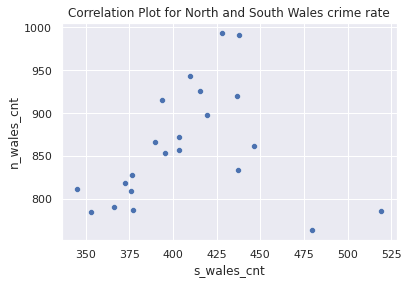

Help on function crime_corr in module __main__:

crime_corr()
    This function displays the correlation between the normalized crime rates of North and South Wales,
    this was created using the scatterplot method of the seaborn library



In [34]:
def crime_corr():
    '''This function displays the correlation between the normalized crime rates of North and South Wales,
    this was created using the scatterplot method of the seaborn library'''
    #splice the required columns of South wales data into a variable
    scat_s = dist_s_wales[['Month','Norm Monthly Crime']]
    #rename the column names using the rename method of pandas
    scat_s =scat_s.rename(columns={"Norm Monthly Crime": "s_wales_cnt"})
    #splice the required columns of North wales data into a variable
    scat_n = dist_n_wales[['Month','Norm Monthly Crime']]
    #rename the column names using the rename method of pandas
    scat_n =scat_n.rename(columns={"Norm Monthly Crime": "n_wales_cnt",'Month':'Month2'})
    #concatenate the north and south wales data into one dataframe
    scatter_w = pd.concat([scat_s, scat_n], axis=1)
    #reset the index to change the current index
    scatter_w = scatter_w.reset_index()
    #drop one of the duplicated months
    scatter_w = scatter_w.drop(['Month2'], axis=1)
    #use seaborn to plot a scatterplot for crime rate and set title of plot
    _ = sns.scatterplot(data=scatter_w, x="s_wales_cnt", y="n_wales_cnt").\
    set_title("Correlation Plot for North and South Wales crime rate")
    plt.show()
    #call help method on this function to show what it does to the user
    help(crime_corr)
crime_corr()

<h4>Output</h4>
We cannot see a clear coorrelation between crime rates in this regions. We will perform a statistical test to confirm this.

<h3>Which region has the Highest crime rate per 10,000 people?</h3>

To check for the region with the highest crime rate per 10,000 people we will be using the swarmplot feature of seaborn which helps plot the normalized crime rate for each month and separates them into regions.

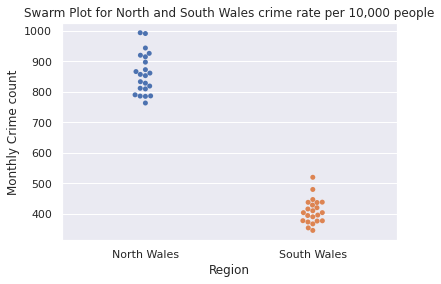

Help on function Highest_crime in module __main__:

Highest_crime()
    This is a bee swarmplot showing the normalized crime rate in each region i.e crime rate per 10,000 
    people in North and South wales. This was created using the seaborn library



In [35]:
def Highest_crime():
    '''This is a bee swarmplot showing the normalized crime rate in each region i.e crime rate per 10,000 
    people in North and South wales. This was created using the seaborn library'''
    #nsert the required columns into the method and select data to be used
    _ = sns.swarmplot(x = 'Region', y = 'Norm Monthly Crime', data= Monthly_crime_count_tot).\
    set_title("Swarm Plot for North and South Wales crime rate per 10,000 people")
    #create the x axis label
    _ = plt.xlabel('Region')
    #create the y axis label
    _ = plt.ylabel('Monthly Crime count')
    plt.show()
    #call help method on this function to show what it does to the user
    help(Highest_crime) 
Highest_crime()

<h4>Output</h4>
We can see that North wales has a higher crime rate per 10,000 people and also it has more spread out values than the South wales crime rate.

<h3>Evolution of crime through time? </h3>

We will use a time series plot to show the evolution of crime rate over time. We will use the normalized crime count to plot the time series graph using the dist_n_wales and dist_s_wales dataframes with the pandas plot method 

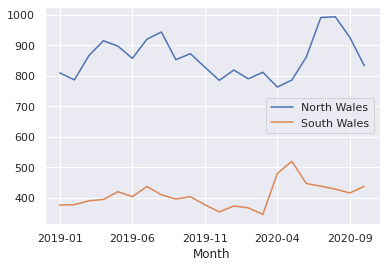

Help on function crime_evo in module __main__:

crime_evo()
    This function shows the evolution of crime over time in North and South Wales. This function
    uses the normalized dataset which means it shows crime per 10,000 people in both regions



In [36]:
def crime_evo():
    '''This function shows the evolution of crime over time in North and South Wales. This function
    uses the normalized dataset which means it shows crime per 10,000 people in both regions'''
    #splice the required columns from the dataframe and set index for north data
    n_plot = dist_n_wales[['Month','Norm Monthly Crime']].set_index('Month')
    #splice the required columns from the dataframe and set index for south data
    s_plot = dist_s_wales[['Month','Norm Monthly Crime']].set_index('Month')
    #assign the northern plot to a variable
    ax = n_plot.plot()
    #use the northern variable to create the southern plot
    s_plot.plot(ax=ax)
    #define the legend for the plot
    ax.legend(["North Wales", "South Wales"])
    plt.show()
    #call help method on this function to show what it does to the user
    help(crime_evo)
crime_evo()

<h3>Output</h3>

The plot above shows that crime per 10,000 people in North Wales is taking a dip while crime rate in Southern Wale is taking a gradual rise.

<h3>Which Crime rate is the most common in North and South Wales?</h3>

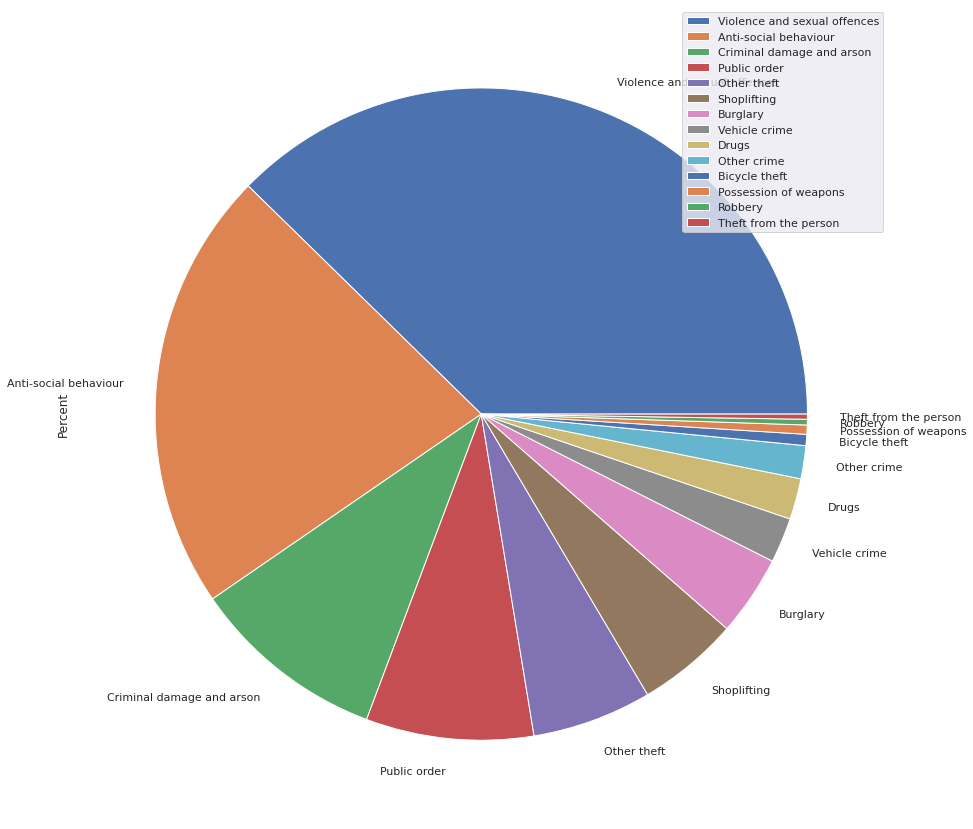

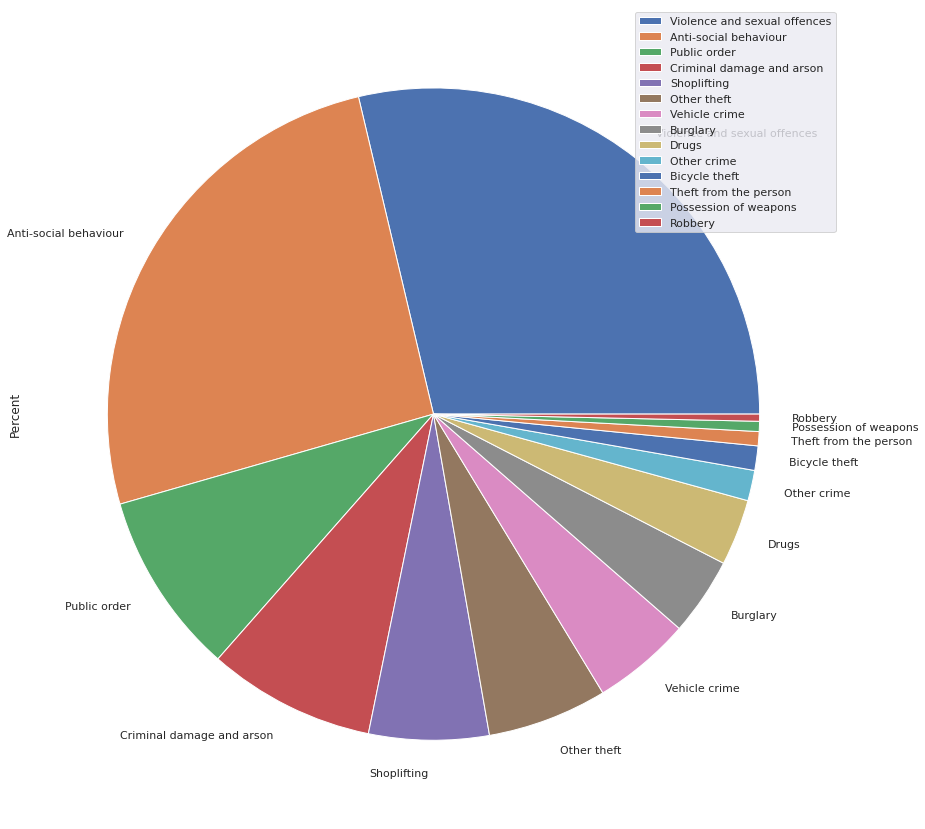

In [37]:
def pop_crime_type():
    '''The goal of this function is to display a piechart with the most popular crime types. This was created
    using the pie method in pandas'''
    #plot the crime types of North wales on a piechart
    plot = crime_cnt_n_wales.set_index('Crime type').plot.pie(y='Percent',figsize=(15, 15))
    #plot the crime types of south wales on a piechart
    plot = crime_cnt_s_wales.set_index('Crime type').plot.pie(y='Percent',figsize=(15, 15))
    plt.show()
pop_crime_type()

<h4>Output</h4>
From the plots above we can see that Voiolent crimes and Anti social behaviours are the most common crime types in North and South Wales

# 4.0 Statistical  Testing

Three statistical tests would be performed in this section using the scipy.stats module, we will be using different classes from the module.




### <u>Research Question 1.0 </u><br/> is the Monthly crime rate for north and south wales normal?</strong>

<u>To-do</u><br/>
We will be testing the crime rate for North and South wales to see if it has normal distribution. 

Details
- We will be using the shapiro-wilk test to check for the distribution.
- The Scipy.stats module is needed and we need to import the shapiro class from the module
- We need just 1-dimensional dataset to input into this method.
- We would be using a p-value of 0.05 which means when we have a value lower than this we can reject the null hypothesis and when it is higher we cannot reject the null hypothesis



<h3>North Wales</h3>
<u>Hypothesis</u><br/>
H0: the North wales dataset has a Gaussian distribution.<br/>
H1: the North wales dataset does not have a Gaussian distribution.



In [38]:
#is the Monthly crime rate for north and south wales normal?
#Interpretation

#import shapiro from scipy module
from scipy.stats import shapiro
#assign the required column to a variable
data_s = dist_s_wales['Norm Monthly Crime']
#assign the output of the test to two variables
stat, p = shapiro(data_s)
#print out the stat and p-value
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('At a 5% significance level we do not have enough evidence to reject the null hypothesis\
    that the South wales dataset has a Gaussian distribution')
else:
    print('At a 5% significance level we have enough evidence to reject the null hypothesis\
    and accept alternative hypothesis that the South wales dataset does not have a Gaussian distribution.')

stat=0.948, p=0.285
At a 5% significance level we do not have enough evidence to reject the null hypothesis    that the South wales dataset has a Gaussian distribution


<h3>South Wales</h3>
<u>Hypothesis</u><br/>
H0: the South wales dataset has a Gaussian distribution.<br/>
H1: the South wales dataset does not have a Gaussian distribution.

In [39]:
dist_n_wales
from scipy.stats import shapiro
data_n = dist_n_wales['Norm Monthly Crime']
stat, p = shapiro(data_n)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('At a 5% significance level we do not have enough evidence to reject the null hypothesis\
    that the South wales dataset has a Gaussian distribution')
else:
    print('At a 5% significance level we have enough evidence to reject the null hypothesis\
    and accept alternative hypothesis that the South wales dataset does not have a Gaussian distribution.')

stat=0.942, p=0.217
At a 5% significance level we do not have enough evidence to reject the null hypothesis    that the South wales dataset has a Gaussian distribution


### <u>Research Question 2.0</u> <br/>What type of relationship do we have between North and South wales crime rate?

<u>To-do</u><br/>
We will be testing the relationship between North and South wales Crime rate. 

Details
- We will be using the spearman correlation test to check for correlation.
- The Scipy.stats module is needed and we need to import the spearmanr class from the module
- The spearmanr method takes two arguments. The two datasets to be compared in a 1-d array
- We would be using a p-value of 0.05 which means when we have a value lower than this we can reject the null hypothesis and when it is higher we cannot reject the null hypothesis
- The correlation will be performed on the normalized crime count, showing crime rate per 10,000 people


H0: North and South Wales crime rate are independent.<br/>
H1: North and South Wales crime rate are dependent.


In [40]:
# Example of the Spearman's Rank Correlation Test
from scipy.stats import spearmanr
#splice the required columns of South wales data into a variable
scat_s = dist_s_wales[['Month','Norm Monthly Crime']]
#rename the column names using the rename method of pandas
scat_s =scat_s.rename(columns={"Norm Monthly Crime": "s_wales_cnt"})
#splice the required columns of North wales data into a variable
scat_n = dist_n_wales[['Month','Norm Monthly Crime']]
#rename the column names using the rename method of pandas
scat_n =scat_n.rename(columns={"Norm Monthly Crime": "n_wales_cnt",'Month':'Month2'})
#concatenate the north and south wales data into one dataframe
scatter_w = pd.concat([scat_s, scat_n], axis=1)
#reset the index to change the current index
scatter_w = scatter_w.reset_index()
#drop one of the duplicated months
scatter_w = scatter_w.drop(['Month2'], axis=1)
stat, p = spearmanr(scatter_w['s_wales_cnt'], scatter_w['n_wales_cnt'])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('At a 5% significance level, we do not have enough statistical evidence to reject the\
    null hypothesis that the crime rate of North and South Wales are independent')
else:
    print('At a 5% significance level, we have enough statistical evidence to reject the\
    null hypothesis that the crime rate of North and South Wales are independent')

stat=0.333, p=0.130
At a 5% significance level, we do not have enough statistical evidence to reject the    null hypothesis that the crime rate of North and South Wales are independent


###  <u>Research Question 3.0</u> <br/>   Is there difference in the combined crime types observed for North and South Wales?

<u>To-do</u>

In this experiement we have grouped the monthly crime rate across North and South wales by the crime type. We will be using a parametric ANOVA test to test if the mean of the different monthly crime rate count differs among the different crime types.

Our assumptions are;

    The subjects have been selected at random from the total groups.
    The dependent variable/response is normally distributed in each group.
    The dependent variable has the same variance in each group.

Details
- We will be using the one-way anova test to check for differences in the different crime rates.
- The Scipy.stats module is needed and we need to import the f_oneway class from the module
- The f_oneway method takes multiple arguments. The list of all the variables to be compared.
- We would be using a p-value of 0.05 which means when we have a value lower than this we can reject the null hypothesis and when it is higher we cannot reject the null hypothesis


The hypotheses in this case are:

   H0 = the mean of the crime rate of South and North Wales is different in each of the different crime types<br/>
   H1 = the mean of the crime rate of South and North Wales is different in each of the different crime types

In [41]:
#create a list of all unique crimes
crime_list = list(n_s_wales_grouped['Crime type'].unique())
#create an empty list
crime_type_cnt = []
#create a for loop to append each crime type and their monthly crime to the list crime_type_cnt
for i in crime_list:
    crime_temp = s_wales_grouped[s_wales_grouped['Crime type']== i]
    crime_temp = crime_temp[['Norm Crime count']]
    crime_temp = crime_temp.rename(columns={"Norm Crime count": i})
    crime_type_cnt.append(crime_temp)

#import the method needed for this test
from scipy.stats import f_oneway
#assign each crime type to a variable
crime1 = crime_type_cnt[0]
crime2 = crime_type_cnt[1]
crime3 = crime_type_cnt[2]
crime4 = crime_type_cnt[3]
crime5 = crime_type_cnt[4]
crime6 = crime_type_cnt[5]
crime7 = crime_type_cnt[6]
crime8 = crime_type_cnt[7]
crime9 = crime_type_cnt[8]
crime10 = crime_type_cnt[9]
crime11 = crime_type_cnt[10]
crime12 = crime_type_cnt[11]
crime13 = crime_type_cnt[12]
crime14 = crime_type_cnt[13]

#apply the f_oneway method
stat, p = f_oneway(crime1, 
crime2, 
crime3,
crime4, 
crime5, 
crime6, 
crime7, 
crime8, 
crime9, 
crime10,
crime11,
crime12,
crime13,
crime14,
)
#print results
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('At a 5% significance level, we do not have enough statistical evidence to reject the\
    null hypothesis that the means of the different crime types are equal')
else:
    print('At a 5% significance level, we have enough statistical evidence to reject the null\
    hypothesis that the means of the different crime types are equal')
       

stat=123.629, p=0.000
At a 5% significance level, we have enough statistical evidence to reject the null    hypothesis that the means of the different crime types are equal


### <u>Research Question 4.0</u> <br/> Is there a difference in Burglary rate during winter and Summer in North Wales?

Details
- We will be using the Paired t test to check for differences in the different crime rates.
- The Scipy.stats module is needed and we need to import the ttest_rel class from the module
- The ttest_rel method takes two arguments. The 1-d array of the variables to be compared.
- We would be using a p-value of 0.05 which means when we have a value lower than this we can reject the null hypothesis and when it is higher we cannot reject the null hypothesis


<u>To-do</u><br/>
In this experiment the goal is to compare the Burglary rate of the two seasons Winter and Summer and this means we are trying to compare two variables with the same response to the same subject which means we would use the Paired T test for this. 

H0: the crime rate in winter and summer are the same.<br/>
H1: the crime rate in winter and summer are not the same.

In [42]:
# Import the ttest_rel module from scipy
from scipy.stats import ttest_rel
#assign the north wales normed data as pair_1_n_temp
#create a dataframe pair_1_n_temp of all monthly crime rate in Winter
pair_1_n_temp = n_wales_grouped[n_wales_grouped['season']== 'Winter']
pair_1_n_temp = pair_1_n_temp [pair_1_n_temp['Year'] == '2019']
pair_1_n_temp = pair_1_n_temp[pair_1_n_temp['Crime type'] == 'Burglary']
pair_1_n = pair_1_n_temp['Norm Crime count']
#create a dataframe pair_1_n_temp of all monthly crime rate in Summer
pair_2_n_temp = n_wales_grouped[n_wales_grouped['season']== 'Summer']
pair_2_n_temp = pair_2_n_temp [pair_2_n_temp['Year'] == '2019']
pair_2_n_temp = pair_2_n_temp[pair_2_n_temp['Crime type'] == 'Burglary']
pair_2_n = pair_2_n_temp['Norm Crime count']

#assign outputs into stat and p
stat, p = ttest_rel(pair_1_n, pair_2_n)
#print output
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('At a 5% significance level, we do not have enough statistical evidence to reject the null hypothesis that the burglary crime rate during Winter and summer are the same')
else:
    print('At a 5% significance level, we have enough statistical evidence to reject the null hypothesis and accept alternative hypothesis that the burglary crime rate during Winter and summer are  different')

stat=-2.312, p=0.147
At a 5% significance level, we do not have enough statistical evidence to reject the null hypothesis that the burglary crime rate during Winter and summer are the same


### <u>Research Question 5.0</u><br/> Is there a difference in Burglary rate during winter and Summer in South Wales?




<u>To-do</u><br/>
In this experiment the goal is to compare the Burglary rate of the two seasons Winter and Summer and this means we are trying to compare two variables with the same response to the same subject which means we would use the Paired T test for this. 

H0: the crime rate in winter and summer are the same.<br/>
H1: the crime rate in winter and summer are not the same.

In [43]:
# Import the ttest_rel module from scipy
from scipy.stats import ttest_rel
#assign the south wales normed data as pair_1_n_temp
#create a dataframe pair_1_s of all monthly crime rate in Winter
pair_1_s_temp = s_wales_grouped[s_wales_grouped['season']== 'Winter']
pair_1_s_temp = pair_1_s_temp [pair_1_s_temp['Year'] == '2019']
pair_1_s_temp = pair_1_s_temp[pair_1_s_temp['Crime type'] == 'Burglary']
pair_1_s = pair_1_s_temp['Norm Crime count']
#create a dataframe pair_2_s of all monthly crime rate in Winter
pair_2_s_temp = s_wales_grouped[n_wales_grouped['season']== 'Summer']
pair_2_s_temp = pair_2_s_temp [pair_2_s_temp['Year'] == '2019']
pair_2_s_temp = pair_2_s_temp[pair_2_s_temp['Crime type'] == 'Burglary']
pair_2_s = pair_2_s_temp['Norm Crime count']

#assign outputs into stat and p
stat, p = ttest_rel(pair_1_s, pair_2_s)
#print output
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print('At a 5% significance level, we do not have enough statistical evidence to reject the null hypothesis that the burglary crime rate during Winter and summer are the same')
else:
    print('At a 5% significance level, we have enough statistical evidence to reject the null hypothesis and accept alternative hypothesis that the burglary crime rate during Winter and summer are  different')

stat=-0.453, p=0.695
At a 5% significance level, we do not have enough statistical evidence to reject the null hypothesis that the burglary crime rate during Winter and summer are the same


# 5.0 Heatmap

This is a simple heat map created using the Folium and Basemap library to model the crime recorded by both the North and South Wales police district

<u>To-do</u><br/>
In this task we would be drawing a heatmap for crime rate in both North and South Wales

Details
- The library used is Folium which needs to be imported before use
- To use this chunk of code you will need to import the joined csv file
- The columns 'Context', 'Last outcome category','Crime ID' needs to be dropped from both dataframes
- There is a need for the concatenation of both datarames to create a single one
- Use the zip method to combine the values in the longitude and latitude columnss
- use the folium.Map method to set the default location of the map
- Set the longitude and Latitude to be plotted



<strong>Warning!!!!!</strong>
Ensure you insert the path to the folder that contains the South and North wales dataset!

In [44]:

def heat_map(path_n,path_s):
    '''This is a function for creating heatmaps, the function takes the concatenated files for both North
    and South wales dataset, it the uses this to produce heatmap for the crime rate of these regions'''
    #assign the north wales file to path_n
    map_n_wales = pd.read_csv(path_n)
    #assign the south wales file to path_s
    map_s_wales = pd.read_csv(path_s)
    #drop the unwanted columns
    map_n_wales = map_n_wales.drop(['Context', 'Last outcome category','Crime ID'], axis=1)
    #drop the unwanted columns
    map_s_wales = map_s_wales.drop(['Context', 'Last outcome category','Crime ID'], axis=1)
    #drop rows with missing values
    map_s_wales = map_s_wales.dropna()
    #drop rows with missing values
    map_n_wales = map_n_wales.dropna()
    #concatenate the cleaned north and south wales data
    map_s_n_wales = pd.concat([map_s_wales,map_n_wales])
    #zip two required columns and assign to a variable 
    crime_locations = list(zip(map_s_n_wales.Latitude, map_s_n_wales.Longitude))
    # generate map
    base_map = folium.Map(location=[52.2417, -3.3777], zoom_start=6.5)
    heatmap = plugins.HeatMap(crime_locations, radius=3, blur=2)
    return base_map.add_child(heatmap)
#callfunction with two parameters the location of the South and North wales files
heat_map('/home/kp/Documents/David Kidner Assessment/Assessment/Lateef M K 30028762/Northwales/North_wales_tot.csv',\
         '/home/kp/Documents/David Kidner Assessment/Assessment/Lateef M K 30028762/Southwales/South_wales_tot.csv')

# Data Exploration App

This is a simple App created using the Tkinter and Pillow library to model the crime recorded by both the North and South Wales police district. The dataset used for this application has been normalized so it will be showing crime rae per population of 10,000 in both regions.

<u>To-do</u><br/>
In this task we would be creating a application for our data exploration of the dataset.

Details
- The library used is Tkinter and Pillow which needs to be imported before use
- To use this chunk of code you will need to ensure data wrangling phase of this document has been completed already
- We also need to confirm that the logo file is in the same directory as this file being used.
- This code contains 8 functions each with its own button on the GUI, on clicking any of this button the app would be prompted to run the related function and display the output.
- The Seaborn module was used extensively in this code to create beautiful plots.
- The App displays the output of any of the button clicked in this consile.
- On running this block of code the application is initiated and you should see a pop where you can interact with the applications.
- Always close the application after use to avoid interference when using other parts of this document.



In [ ]:
import tkinter as tk
from PIL import Image, ImageTk
#set the root of the app
root = tk.Tk()
#define the space the app would cover
canvas = tk.Canvas(root, width=900, height=300)
#define the columns the app would span
canvas.grid(columnspan = 3)


#create a logo using the pillow image library
#create a variable logo to hold the image
logo = Image.open('logo.png')
#use the photoimage method to insert the image as logo
logo = ImageTk.PhotoImage(logo)
#assign the label
logo_label = tk.Label(image = logo)
logo_label.image = logo
#select the row and column image should appear
logo_label.grid(column=1, row =0)


#instructions
instructions = tk.Label(root, text='Data Explorer', font = "Raleway")
instructions.grid(columnspan = 3, column = 0, row=1)


def police_patrol():
    '''This functions shows the top 10 locations within the different regions that has the highest crime rate
    this is to recommend locations in need of frequent police patrol to curb crime in the area.'''
    # define a temporary variable to hold the count of crimes grouped by crime location
    n_policing_temp = n_wales[['LSOA name','Crime type']].groupby('LSOA name').count()
    #reset index of the variable to change the current index
    n_policing_temp.reset_index(inplace=True)
    #sort the values in descending order to show top values
    n_policing = n_policing_temp.sort_values(by=['Crime type'],ascending=False).head(10)
    #use seaborn barplot method to create a bar plot of the top 10 values and set a title
    _ = sns.barplot(x = 'Crime type', y = 'LSOA name',  data= n_policing)\
    .set_title("Top ten Crime locations in North Wales per 10,000 people")
    plt.show()
    # define a temporary variable to hold the count of crimes grouped by crime location
    s_policing_temp = s_wales[['LSOA name','Crime type']].groupby('LSOA name').count()
    #reset index of the variable to change the current index
    s_policing_temp.reset_index(inplace=True)
    #sort the values in descending order to show top values
    s_policing = s_policing_temp.sort_values(by=['Crime type'],ascending=False).head(10)
    #use seaborn barplot method to create a bar plot of the top 10 values and set a title
    _ = sns.barplot(x = 'Crime type', y = 'LSOA name',  data= s_policing)\
    .set_title("Top ten Crime locations in South Wales per 10,000 people")
    plt.show()
    #call help method on this function to show what it does to the user
    help(police_patrol)
    #switch the button status to report generated
    browse_text.set("Report Generated, check console")  

    
def Common_crimes():
    '''This function creates a grid plot using seaborn to show the a monthly barplot of the crime rate of
    the different crime type. The rows shows the month while the column shows the region.'''
    #We will plot a grid plot with a barchart showing the Crime count by crime type monthly for each region 
    #North Wales to the Left and South Wales to the right
    #creating a FacetGrid with Seaborn library and this is where we select dataset to be used
    grid = sns.FacetGrid(n_s_wales_grouped, row='Month', col='Region', height=3.5,aspect = 2.65)
    #create a variable crime order to hold the order in which the plots would be displayed
    crime_order = list(n_s_wales_grouped['Crime code'].unique())
    #lets populate the facetGrid with the specific plots and add the order
    _ = grid.map(sns.barplot, 'Crime code','Norm Crime count',alpha=0.5,order = crime_order )
    grid.fig.subplots_adjust(top=0.96)
    #adding the title of the plot
    _ = grid.fig.suptitle('Most common crime types per 10,000 people in North and South Wales', fontsize=28)
    plt.show()
    #call help method on this function to show what it does to the user
    help(Common_crimes)
    #show the crime codes
    print(crime_mapping)
    browse_text2.set("Report Generated, check console")  


    
    
def Covid_crimes():
    '''This function displays a barplot showing a comparison between the crime rate before covid and during
    covid, This was created using the seaborn gridplot module'''
    #We will plot a grid plot with a barchart showing the Crime count by crime type monthly for each region 
    #North Wales to the Left and South Wales to the right
    #creating a FacetGrid with Seaborn library and assigning data to be used
    grid = sns.FacetGrid(n_s_wales_grouped, row='Covid', col='Region', height=3.5,aspect = 2.65)
    #create a variable crime order to hold the order in which the plots would be displayed
    crime_order2 = list(n_s_wales_grouped['Crime code'].unique())
    #lets populate the facetGrid with the specific plots and add the order
    _ = grid.map(sns.barplot, 'Crime code','Norm Crime count',alpha=0.5,order = crime_order2)
    grid.fig.subplots_adjust(top=0.8)
    #adding the title of the plot
    _ = grid.fig.suptitle('Difference in crime rate before and during COVID 19 per 10,000 people', fontsize=28)
    plt.show()
    #call help method on this function to show what it does to the user
    help(Covid_crimes)
    #show the crime codes
    print(crime_mapping)
    browse_text3.set("Report Generated, check console")  
        
def Seasonal_crimes():
    '''This function displays a barplot showing a comparison between the crime rate grouped by season, 
    This was created using the seaborn gridplot module '''
    #We will plot a grid plot with a barchart showing the Crime count by crime type monthly for each region 
    #North Wales to the Left and South Wales to the right
    #creating a FacetGrid with Seaborn library and assigning data to be used
    grid = sns.FacetGrid(n_s_wales_grouped, row='season', col='Region', height=3.5,aspect = 2.65)
    #create a variable crime order to hold the order in which the plots would be displayed
    crime_order3 = list(n_s_wales_grouped['Crime code'].unique())
    #lets populate the facetGrid with the specific plots
    _ = grid.map(sns.barplot, 'Crime code','Norm Crime count',alpha=0.5,order=crime_order3)
    plt.show()
    #call help method on this function to show what it does to the user
    help(Seasonal_crimes)
    #show the crime codes
    print(crime_mapping)
    browse_text4.set("Report Generated, check console")  

        
        
def crime_corr():
    '''This function displays the correlation between the normalized crime rates of North and South Wales,
    this was created using the scatterplot method of the seaborn library'''
    #splice the required columns of South wales data into a variable
    scat_s = dist_s_wales[['Month','Norm Monthly Crime']]
    #rename the column names using the rename method of pandas
    scat_s =scat_s.rename(columns={"Norm Monthly Crime": "s_wales_cnt"})
    #splice the required columns of North wales data into a variable
    scat_n = dist_n_wales[['Month','Norm Monthly Crime']]
    #rename the column names using the rename method of pandas
    scat_n =scat_n.rename(columns={"Norm Monthly Crime": "n_wales_cnt",'Month':'Month2'})
    #concatenate the north and south wales data into one dataframe
    scatter_w = pd.concat([scat_s, scat_n], axis=1)
    #reset the index to change the current index
    scatter_w = scatter_w.reset_index()
    #drop one of the duplicated months
    scatter_w = scatter_w.drop(['Month2'], axis=1)
    #use seaborn to plot a scatterplot for crime rate and set title of plot
    _ = sns.scatterplot(data=scatter_w, x="s_wales_cnt", y="n_wales_cnt").\
    set_title("Correlation Plot for North and South Wales crime rate")
    plt.show()
    #call help method on this function to show what it does to the user
    help(crime_corr)
    browse_text5.set("Report Generated, check console")  
        

def Highest_crime():
    '''This is a bee swarmplot showing the normalized crime rate in each region i.e crime rate per 10,000 
    people in North and South wales. This was created using the seaborn library'''
    #nsert the required columns into the method and select data to be used
    _ = sns.swarmplot(x = 'Region', y = 'Norm Monthly Crime', data= Monthly_crime_count_tot).\
    set_title("Swarm Plot for North and South Wales crime rate per 10,000 people")
    #create the x axis label
    _ = plt.xlabel('Region')
    #create the y axis label
    _ = plt.ylabel('Monthly Crime count')
    plt.show()
    #call help method on this function to show what it does to the user
    help(Highest_crime)
    browse_text6.set("Report Generated, check console")  
        
def crime_evo():
    '''This function shows the evolution of crime over time in North and South Wales. This function
    uses the normalized dataset which means it shows crime per 10,000 people in both regions'''
    #splice the required columns from the dataframe and set index for north data
    n_plot = dist_n_wales[['Month','Norm Monthly Crime']].set_index('Month')
    #splice the required columns from the dataframe and set index for south data
    s_plot = dist_s_wales[['Month','Norm Monthly Crime']].set_index('Month')
    #assign the northern plot to a variable
    ax = n_plot.plot()
    #use the northern variable to create the southern plot
    s_plot.plot(ax=ax)
    #define the legend for the plot
    ax.legend(["North Wales", "South Wales"])
    plt.show()
    #call help method on this function to show what it does to the user
    help(crime_evo)
    browse_text7.set("Report Generated, check console") 
        
def pop_crime_type():
    '''The goal of this function is to display a piechart with the most popular crime types. This was created
    using the pie method in pandas'''
    #plot the crime types of North wales on a piechart
    plot = crime_cnt_n_wales.set_index('Crime type').plot.pie(y='Percent',figsize=(15, 15))
    #plot the crime types of south wales on a piechart
    plot = crime_cnt_s_wales.set_index('Crime type').plot.pie(y='Percent',figsize=(15, 15))
    plt.show()
    browse_text8.set("Report Generated, check console") 

     
    
#police_patrol button   
#assign the browse text as a string
browse_text = tk.StringVar()
#create a button to call the police_patrol function on click and assign the parameters
browse_btn = tk.Button(root, textvariable=browse_text,command = lambda:police_patrol(), \
                       font="Raleway", bg="#20bebe", fg="white", height=2, width=50)
#set the name of the button
browse_text.set("Generate areas in need of patrol")
#assign the column and row the button should appear
browse_btn.grid(column=1, row=2)


#Common_crimes button   
#assign the browse text as a string
browse_text2 = tk.StringVar()
#create a button to call the Common_crimes function on click and assign the parameters
browse_btn2 = tk.Button(root, textvariable=browse_text2, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:Common_crimes(), \
                        height=2, width=50)
#set the name of the button
browse_text2.set("Common Crimes in North and South Wales")
#assign the column and row the button should appear
browse_btn2.grid(column=1, row=4)


#Common_crimes button   
#assign the browse text as a string
browse_text3 = tk.StringVar()
#create a button to call the Common_crimes function on click and assign the parameters
browse_btn3 = tk.Button(root, textvariable=browse_text3, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:Covid_crimes(), \
                        height=2, width=50)
#set the name of the button
browse_text3.set("Pre-Covid Crimes Vs Covid Crimes")
#assign the column and row the button should appear
browse_btn3.grid(column=1, row=6)


#Seasonal_crimes button   
#assign the browse text as a string
browse_text4 = tk.StringVar()
#create a button to call the Seasonal_crimes function on click and assign the parameters
browse_btn4 = tk.Button(root, textvariable=browse_text4, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:Seasonal_crimes(), \
                        height=2, width=50)
#set the name of the button
browse_text4.set("Crime rate by Season")
#assign the column and row the button should appear
browse_btn4.grid(column=1, row=7)

#crime_corr button   
#assign the browse text as a string
browse_text5 = tk.StringVar()
#create a button to call the crime_corr function on click and assign the parameters
browse_btn5 = tk.Button(root, textvariable=browse_text5, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:crime_corr(), \
                        height=2, width=50)
#set the name of the button
browse_text5.set("North and South Wales Crime correlation")
#assign the column and row the button should appear
browse_btn5.grid(column=1, row=8)


#Highest_crime button   
#assign the browse text as a string
browse_text6 = tk.StringVar()
#create a button to call the Highest_crime function on click and assign the parameters
browse_btn6 = tk.Button(root, textvariable=browse_text6, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:Highest_crime(), \
                        height=2, width=50)
#set the name of the button
browse_text6.set("Region With Highest Crime Rate")
#assign the column and row the button should appear
browse_btn6.grid(column=1, row=9)

#crime_evo button   
#assign the browse text as a string
browse_text7 = tk.StringVar()
#create a button to call the crime_evo function on click and assign the parameters
browse_btn7 = tk.Button(root, textvariable=browse_text7, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:crime_evo(), \
                        height=2, width=50)
#set the name of the button
browse_text7.set("Evolution of crime over time")
#assign the column and row the button should appear
browse_btn7.grid(column=1, row=10)

#pop_crime_type button   
#assign the browse text as a string
browse_text8 = tk.StringVar()
#create a button to call the pop_crime_type function on click and assign the parameters
browse_btn8 = tk.Button(root, textvariable=browse_text8, \
                       font="Raleway", bg="#20bebe", fg="white", command = lambda:pop_crime_type(), \
                        height=2, width=50)
#set the name of the button
browse_text8.set("Popular Crime type in North and South Wales")
#assign the column and row the button should appear
browse_btn8.grid(column=1, row=12)




canvas = tk.Canvas(root, width=600, height=250)
#set how many columns the app should span
canvas.grid(columnspan=3)






root.mainloop()